<a href="https://colab.research.google.com/github/hugomilesi/Predictions-for-Brazillian-Car-Prices-2023-/blob/main/model_build.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install category_encoders
!wget https://raw.githubusercontent.com/hugomilesi/Predictions-for-Brazillian-Car-Prices-2023-/main/data/train_df.csv -O 'train_df.csv'
!wget https://raw.githubusercontent.com/hugomilesi/Predictions-for-Brazillian-Car-Prices-2023-/main/data/validation_df.csv -O "validation_df.csv"

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.9/81.9 kB 3.1 MB/s eta 0:00:00
--2023-11-27 18:18:44--  https://raw.githubusercontent.com/hugomilesi/Predictions-for-Brazillian-Car-Prices-2023-/main/data/train_df.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 23875034 (23M) [text/plain]
Saving to: ‘train_df.csv’

train_df.csv        100%[===================>]  22.77M  --.-KB/s    in 0.1s    

2023-11-27 18:18:45 (157 MB/s) - ‘train_df.csv’ saved [23875034/23875034]

--2023-11-27 18:18:45--  https://raw.githubusercontent.com/hugomilesi/Predictions-for-Brazillian-Car-Prices-2023-/main/data/validation_df.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.109.133, 185.199.108.133, ...
Connecting to raw.githubuser

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import plotly.express as px
import plotly.graph_objects as go

# data preprocessing
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder, OrdinalEncoder
from category_encoders.target_encoder import TargetEncoder
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
# models
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor
from sklearn.linear_model import LinearRegression
import pickle

# metrics
from sklearn.metrics import mean_squared_error, r2_score, make_scorer, explained_variance_score, mean_absolute_error

# layout predictions
import ipywidgets as widgets
from IPython.display import display

In [3]:
df = pd.read_csv('/content/train_df.csv')
df = df.iloc[:, 1:]

df['year_model'] = df['year_model'].astype('object')
df['year_of_reference'] = df['year_of_reference'].astype('object')
df.head()


,year_of_reference,month_of_reference,brand,model,fuel,gear,engine_size,year_model,avg_price_brl,age_years
0,2022,January,Acura,NSX 3.0,Gasoline,manual,3.0,1995,43779.0,28
1,2022,January,Acura,NSX 3.0,Gasoline,manual,3.0,1994,42244.0,29
2,2022,January,Acura,NSX 3.0,Gasoline,manual,3.0,1993,40841.0,30
3,2022,January,Acura,NSX 3.0,Gasoline,manual,3.0,1992,39028.0,31
4,2022,January,Acura,NSX 3.0,Gasoline,manual,3.0,1991,35678.0,32


In [4]:
# splitting data
x = df.drop('avg_price_brl', axis = 1)
y = df['avg_price_brl']

X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.30, random_state=0)

cat_data = ['month_of_reference', 'brand', 'model', 'fuel', 'gear', 'year_model', 'year_of_reference']
num_data = ['engine_size', 'age_years']

n_unique_categories = df[cat_data].nunique().sort_values(ascending=False)
n_unique_categories

model                 5148
brand                   81
year_model              39
month_of_reference      12
fuel                     3
gear                     2
year_of_reference        1
dtype: int64

 There are two types of categorical data in this dataset:
 1. Categorical features with high cardinality data.
 2. Categorical features with low cardinality data.

 To solve this problem, i will one-hot encode 'fuel', 'gear' and year_of_reference' and target-encode the others.  

In [5]:
# @title Preprocessing Pipeline

high_cardinality_features = ['model', 'brand', 'year_model', 'month_of_reference']
low_cardinality_features = ['fuel', 'gear', 'year_of_reference']

mixed_encoded_preprocessor = ColumnTransformer(
    [
        ('numerical', StandardScaler(), num_data),
        (
            'high_cardinality',
            TargetEncoder(),
            high_cardinality_features,
        ),
        ("low_cardinality",
         OrdinalEncoder(handle_unknown= 'use_encoded_value', unknown_value = -1),
         low_cardinality_features,
         ),
    ],
    verbose_feature_names_out = False,
)


mixed_encoded_preprocessor.set_output(transform = 'pandas')


ColumnTransformer(transformers=[('numerical', StandardScaler(),
                                 ['engine_size', 'age_years']),
                                ('high_cardinality', TargetEncoder(),
                                 ['model', 'brand', 'year_model',
                                  'month_of_reference']),
                                ('low_cardinality',
                                 OrdinalEncoder(handle_unknown='use_encoded_value',
                                                unknown_value=-1),
                                 ['fuel', 'gear', 'year_of_reference'])],
                  verbose_feature_names_out=False)

In [6]:
# get a representation of the data ready for training
prepared_data = mixed_encoded_preprocessor.fit_transform(x, y)
prepared_data.head()

,engine_size,age_years,model,brand,year_model,month_of_reference,fuel,gear,year_of_reference
0,0.981391,1.382268,41524.068039,26142.964056,18831.782242,51073.68982,2.0,1.0,0.0
1,0.981391,1.493669,41524.068039,26142.964056,19502.058657,51073.68982,2.0,1.0,0.0
2,0.981391,1.605070,41524.068039,26142.964056,19070.240385,51073.68982,2.0,1.0,0.0
3,0.981391,1.716471,41524.068039,26142.964056,16635.148359,51073.68982,2.0,1.0,0.0
4,0.981391,1.827872,41524.068039,26142.964056,16598.244741,51073.68982,2.0,1.0,0.0


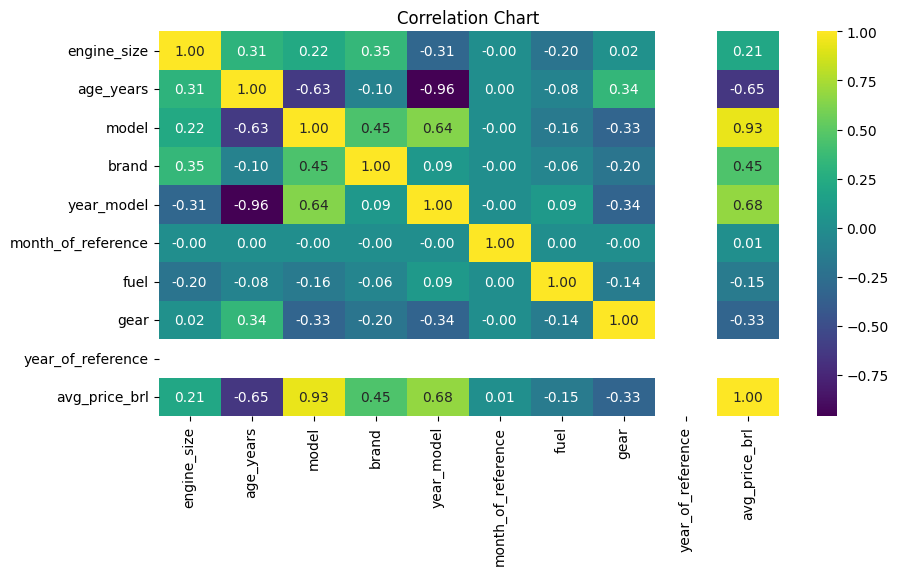

In [7]:
# @title Checking Correlation
custom_palette = sns.color_palette("viridis", as_cmap=True)
plt.figure(figsize=(10, 5))
# Using the custom color palette for the heatmap
sns.heatmap(pd.concat([prepared_data, y], axis = 1).corr(), annot=True, fmt=".2f", cmap=custom_palette)

plt.title('Correlation Chart')
plt.show()

# Model Building


In [8]:
# @title Training Function

def create_pipeline(model):
  """Create a pipeline trainer to avoid repetition"""
  pipeline = Pipeline(steps = [('preprocessor', mixed_encoded_preprocessor),
                              ("model", model)])


  return pipeline


def model_evaluate(regressors, X_train, y_train, X_test, y_test, verbose=False):

    """
    This Function Trains multiple models at once and store its metrics in a dataframe for later use.
    """
    results = []

    for regressor in regressors:
        model_results = {}


        regressor.fit(X_train, y_train)

        # predictions
        y_pred = regressor.predict(X_test)

        model_name = regressor['model']

        # Calculate various metrics
        mse = round(mean_squared_error(y_test, y_pred), 4)
        r2 = round(r2_score(y_test, y_pred), 4)
        explained_variance = round(explained_variance_score(y_test, y_pred), 4)
        mae = round(mean_absolute_error(y_test, y_pred), 4)

        model_results["Model Name"] = str(model_name).split('(')[0]
        model_results["Mean Squared Error (MSE)"] = mse
        model_results["R-squared (R2) Score"] = r2
        model_results["Explained Variance Score"] = explained_variance
        model_results["Mean Absolute Error (MAE)"] = mae

        results.append(model_results)

        if verbose:
            fig = px.scatter(
                x=y_test, y=y_pred, labels={'x': 'Actual Average Price', 'y': 'Predicted Average Price'},
                title=f"Average Car Price Predictions with {str(model_name).split('(')[0]}", opacity=0.65,
                trendline='ols', trendline_color_override='cyan'
            )

            fig.show()
        print(f"Model Overall Score: {regressor.score(X_test, y_test)}")
        print(f"Mean Squared Error(MSE):   {mse}")
        print(f"R-squared (R2) Score:      {r2}")
        print(f"Explained Variance Score:  {explained_variance}")
        print(f"Mean Absolute Error (MAE): {mae}")


    # Create a pandas DataFrame from the results
    results_df = pd.DataFrame(results)

    return results_df

This code block should take a while to load.

In [9]:
# training the models
lr_model = create_pipeline(LinearRegression(fit_intercept = True))
gbr_regressor = create_pipeline(GradientBoostingRegressor(random_state=42))
rf_regressor = create_pipeline(RandomForestRegressor(random_state=42))
dt_regressor = create_pipeline(DecisionTreeRegressor(random_state=42))

# create a list of regressors and call the function to evaluate them
regressors = [lr_model, gbr_regressor, rf_regressor, dt_regressor]  # Replace with your regressor instances
results_df = model_evaluate(regressors, X_train, y_train, X_test, y_test, verbose=True)

Model Overall Score: 0.8691014415637529
Mean Squared Error(MSE):   244030884.6445
R-squared (R2) Score:      0.8691
Explained Variance Score:  0.8691
Mean Absolute Error (MAE): 10473.0802


Model Overall Score: 0.9168607164529412
Mean Squared Error(MSE):   154994471.7121
R-squared (R2) Score:      0.9169
Explained Variance Score:  0.9169
Mean Absolute Error (MAE): 7759.9317


Model Overall Score: 0.995789163573655
Mean Squared Error(MSE):   7850156.2621
R-squared (R2) Score:      0.9958
Explained Variance Score:  0.9958
Mean Absolute Error (MAE): 1308.5258


Model Overall Score: 0.9947434952689056
Mean Squared Error(MSE):   9799569.3382
R-squared (R2) Score:      0.9947
Explained Variance Score:  0.9947
Mean Absolute Error (MAE): 1514.7767


---
# Comparing results
**Quick Recap of Some Metrics:**

**Mean Squared Error (MSE):**

- MSE measures the average squared difference between the predicted values and the actual values (the target values).
- It quantifies the overall quality of the model's predictions, with **lower values indicating a better fit**.

**R-squared (R2) Score**:

- R-squared is a measure of **how well the independent variables (features) explain the variance** in the dependent variable (target).
- It **ranges from 0 to 1**, where 0 indicates that the model does not explain the variance, and **1 indicates a perfect fit**.

**Explained Variance Score:**

- The Explained Variance Score is similar to R2 and measures the proportion of the variance in the dependent variable that is explained by the independent variables.
- Like R2, it also **ranges from 0 to 1**, with **higher values indicating better explanatory power**.

**Mean Absolute Error (MAE):**

- MAE measures the average absolute difference between the predicted values and the actual values.
- It provides a measure of the model's accuracy, with **lower values indicating better accuracy**.


In [10]:
# @title Model Results
results_df

,Model Name,Mean Squared Error (MSE),R-squared (R2) Score,Explained Variance Score,Mean Absolute Error (MAE)
0,LinearRegression,2.440309e+08,0.8691,0.8691,10473.0802
1,GradientBoostingRegressor,1.549945e+08,0.9169,0.9169,7759.9317
2,RandomForestRegressor,7.850156e+06,0.9958,0.9958,1308.5258
3,DecisionTreeRegressor,9.799569e+06,0.9947,0.9947,1514.7767


In [11]:
# @title Best Model
# Find the model with the lowest MSE
lowest_mse_model = results_df[results_df["Mean Squared Error (MSE)"] == results_df["Mean Squared Error (MSE)"].min()]
print(f"Model with the highest MSE score: {lowest_mse_model[['Model Name', 'Mean Squared Error (MSE)']].values}")
print()

# Find the model with the highest R-squared
highest_r2_model = results_df[results_df["R-squared (R2) Score"] == results_df["R-squared (R2) Score"].max()]
print(f"Model with the highest R-squared score: {highest_r2_model[['Model Name', 'R-squared (R2) Score']].values}")
print()

# Find the model with the highest Explained Variance
highest_ev_model = results_df[results_df["Explained Variance Score"] == results_df["Explained Variance Score"].max()]
print(f"Model with the highest Explained Variance score:{highest_ev_model[['Model Name', 'Explained Variance Score']].values}")
print()

# Find the model with the lowest MAE
lowest_mae_model = results_df[results_df["Mean Absolute Error (MAE)"] == results_df["Mean Absolute Error (MAE)"].min()]
print(f"Model with the highest MAE score: {lowest_mae_model[['Model Name', 'Mean Absolute Error (MAE)']].values}")
print()


Model with the highest MSE score: [['RandomForestRegressor' 7850156.2621]]

Model with the highest R-squared score: [['RandomForestRegressor' 0.9958]]

Model with the highest Explained Variance score:[['RandomForestRegressor' 0.9958]]

Model with the highest MAE score: [['RandomForestRegressor' 1308.5258]]



In [12]:
# Saving the best model
with open('model_pipeline.pkl', 'wb') as file:
    pickle.dump(rf_regressor, file)

---


# Testing with new data

In [13]:
# @title Validation Data

new_df = pd.read_csv('/content/validation_df.csv')
new_df['age_years'] = new_df['age_years'].replace(-1, 0)
new_df = new_df.iloc[:, 1:]

new_df['year_model'] = new_df['year_model'].astype('object')
new_df['year_of_reference'] = new_df['year_of_reference'].astype('object')
new_df.tail()

,year_of_reference,month_of_reference,brand,model,fuel,gear,engine_size,year_model,avg_price_brl,age_years
515317,2023,January,Walk,Buggy Walk Sport 1.6 8V 58cv,Gasoline,manual,1.6,2009,22790.0,14
515318,2023,January,Walk,Buggy Walk Sport 1.6 8V 58cv,Gasoline,manual,1.6,2008,22169.0,15
515319,2023,January,Walk,Buggy Walk Sport 1.6 8V 58cv,Gasoline,manual,1.6,2007,21565.0,16
515320,2023,January,Walk,Buggy Walk Sport 1.6 8V 58cv,Gasoline,manual,1.6,2006,20978.0,17
515321,2023,January,Walk,Buggy Walk Sport 1.6 8V 58cv,Gasoline,manual,1.6,2005,18365.0,18


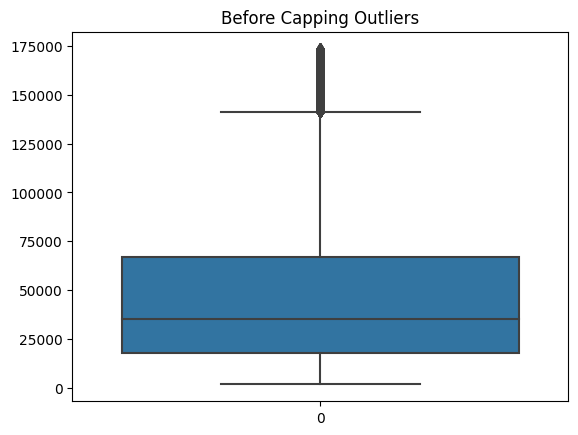

In [14]:
# Checking for Outliers
sns.boxplot(new_df['avg_price_brl'])
plt.title('Before Capping Outliers')
plt.show()

In [15]:
# @title Capping Outliers

def cap_outliers(df):

  Q1 = np.percentile(df['avg_price_brl'], 25, method='midpoint')
  Q3 = np.percentile(df['avg_price_brl'], 75, method='midpoint')
  IQR = Q3 - Q1

  print("Old Shape: ", df.shape)

  # Upper bound
  upper = np.where(df['avg_price_brl'] >= (Q3 + 1 * IQR))
  # Lower bound
  lower = np.where(df['avg_price_brl'] <= (Q1 - 1 * IQR))

  # Copy the DataFrame and remove the outliers
  final_df = df.copy()
  final_df.drop(upper[0], inplace=True)
  final_df.drop(lower[0], inplace=True)

  print("New Shape: ", final_df.shape)

  return final_df

new_df = cap_outliers(new_df)

Old Shape:  (515322, 10)
New Shape:  (473675, 10)


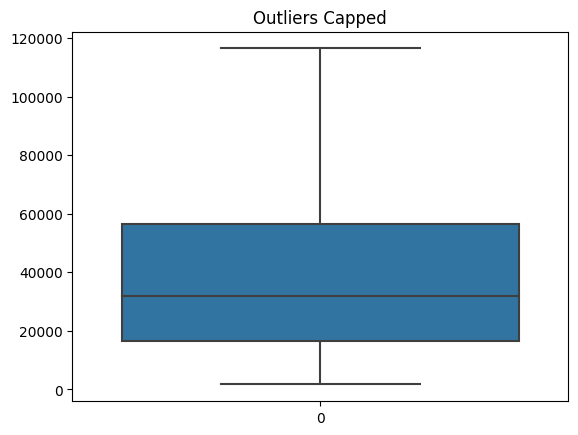

In [16]:
sns.boxplot(new_df['avg_price_brl'])
plt.title('Outliers Capped')
plt.show()

In [17]:
# @title Car Price Perdictions for 2023
new_df = new_df[new_df['year_of_reference'] == 2023]

x = new_df.drop('avg_price_brl', axis = 1)
y = new_df['avg_price_brl']

with open('model_pipeline.pkl', 'rb') as file:
    loaded_pipeline = pickle.load(file)

# predictions and score
preds = loaded_pipeline.predict(x)
score = r2_score(y, preds)

# add predictions to dataframe
new_df['predicted_price'] = preds

fig = px.scatter(
                x=new_df['avg_price_brl'], y=new_df['predicted_price'], labels={'x': 'Actual Average Price', 'y': 'Predicted Average Price'},
                title=f"Average Car Price Predictions with RanfomForestRegressor for year of 2023", opacity=0.65,
                trendline='ols', trendline_color_override='cyan'
            )

fig.show()


print('Model Score: ', score)

Model Score:  0.9823811152803015


# Single DataPrediction

In [22]:
# @title functions

# dict to facilitate the layout creation
categories = {
    'year_model': sorted(df['year_model'].unique().tolist()),
    'fuel': sorted(df['fuel'].unique().tolist()),
    'gear': sorted(df['gear'].unique().tolist()),
    'year_of_reference': sorted(df['year_of_reference'].unique().tolist()),
    'car_name': sorted(df['model'].unique().tolist()),
    'brand': sorted(df['brand'].unique().tolist()),
    'engine_size': sorted(df['engine_size'].unique().tolist()),
    'month_of_reference': sorted(df['month_of_reference'].unique().tolist())}



def create_widget(col_name, numeric = False, description = 'numeric_selectbox'):
  """Function to create widget layout"""
  text_layout = widgets.Layout(width='400px', height='40px')
  number_layout = widgets.Layout(width='400px', height='40px')

  if numeric:
    # selectbox for number
    selectbox = widgets.Dropdown(
        #placeholer = categories[col_name][0],
        options=categories[col_name],
        description= description,
        style= {'description_width': '200px'},
        disabled=False,
        layout = text_layout
      )
  else:
    # selectbox for text
    selectbox = widgets.Combobox(
        placeholder = categories[col_name][0],
        options= categories[col_name],
        description= description,
        ensure_option=True,
        style= {'description_width': '200px'},
        disabled=False,
        layout = number_layout
    )

  return selectbox


def model_predict(year_of_reference, month_of_reference, brand, car_name, fuel, gear, engine_size, year_model):
    """Transform input data from widgets and train the model"""

    # store the values and create a dataframe
    input_data = pd.DataFrame ({
    'year_of_reference': str(year_of_reference),
    'month_of_reference': month_of_reference,
    'brand': brand,
    'model': car_name,
    'fuel': fuel,
    'gear': gear,
    'engine_size': float(engine_size),
    'year_model': year_model,
    'age_years': int(year_of_reference - year_model)
    }, index = [0])


    try:
      if year_of_reference < year_model:
        print("The model year cannot exceed the year of reference.")
      else:
        print(f"Predicted Price: {loaded_pipeline.predict(input_data)[0]}")
    except ValueError:
      print('Input error. Please check if all fields where filled.')



In [27]:
# @title Layout_creation
# creating selectbox layouts
year_of_reference = create_widget('year_model', numeric = True, description = "Year of reference")
month_of_reference = create_widget('month_of_reference', description = 'Month of reference')
side_by_side_boxes = widgets.HBox([year_of_reference, month_of_reference])

brand = create_widget('brand', description = 'Car Brand')
car_name = create_widget('car_name', description = 'Car Model')
side_by_side_boxes2 = widgets.HBox([brand, car_name])

fuel = create_widget('fuel', description = 'Fuel Type:')
gear = create_widget('gear', description = 'Gear Type')
side_by_side_boxes3 = widgets.HBox([fuel, gear])


engine_size = create_widget('engine_size',True, description = 'Engine Size')
year_model = create_widget('year_model',True, description = 'Year model')
side_by_side_boxes4 = widgets.HBox([engine_size, year_model])

age_years = year_of_reference.value - year_model.value

# Create a button with the label 'predict'
predict_button = widgets.Button(description='Predict')
predict_button.on_click(lambda button: model_predict(year_of_reference.value, month_of_reference.value, brand.value, car_name.value, fuel.value, gear.value, engine_size.value, year_model.value))


# Create a flexbox layout for the button
button_box_layout = widgets.Layout(display='flex', flex_flow='column', align_items='center', width='55%')
# Create an HBox for the button and center it using flex property
centered_button_box = widgets.HBox([widgets.Label(), predict_button], layout=button_box_layout)
# Display the layout with all the selectboxes and the centered button

display(widgets.VBox([side_by_side_boxes, side_by_side_boxes2, side_by_side_boxes3, side_by_side_boxes4, centered_button_box]))


Predicted Price: 28962.785
